In [1]:
import os
import random
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

In [2]:
# 데이터 경로 설정
base_path = "./dataset/Training"
original_folder = os.path.join(base_path, "[원천]오이_0.정상")
label_folder = os.path.join(base_path, "[라벨]오이_0.정상")

In [3]:
# 원천 데이터에서 파일 선택
original_files = [f for f in os.listdir(original_folder) if f.endswith('.jpg')]
selected_files = random.sample(original_files, 20)

In [4]:
# 바운딩 박스 중심을 기준으로 정사각형으로 이미지 자르기
def crop_square_image(image_path, label_path):
    """
    바운딩 박스의 중심을 기준으로 정사각형으로 이미지를 자르는 함수.
    """
    # 이미지 로드
    image = Image.open(image_path)
    image_width, image_height = image.size

    # 라벨 로드
    with open(label_path, 'r', encoding='utf-8') as f:
        label_data = json.load(f)
    
    # 바운딩 박스 정보 추출
    annotations = label_data.get("annotations", {})
    points = annotations.get("points", [])
    
    if not points:
        print(f"No bounding box found for {os.path.basename(image_path)}")
        return image  # 바운딩 박스가 없으면 원본 반환

    # 바운딩 박스 중심과 길이 계산
    point = points[0]  # 첫 번째 바운딩 박스만 처리
    xtl, ytl, xbr, ybr = point['xtl'], point['ytl'], point['xbr'], point['ybr']
    center_x = (xtl + xbr) // 2
    center_y = (ytl + ybr) // 2
    bbox_width = xbr - xtl
    bbox_height = ybr - ytl

    # 정사각형 한 변의 길이 결정 (가로/세로 중 더 긴 값)
    square_side = (bbox_width + bbox_height) // 2
    
    # 정사각형 영역 계산
    left = max(center_x - square_side // 2, 0)
    top = max(center_y - square_side // 2, 0)
    right = min(center_x + square_side // 2, image_width)
    bottom = min(center_y + square_side // 2, image_height)
    
    # 이미지 자르기
    cropped_image = image.crop((left, top, right, bottom))
    return cropped_image

In [5]:
# 4장씩 묶어서 그리드로 시각화
def visualize_images_grid_with_crop(image_label_pairs, grid_size=(2, 2)):
    """
    이미지를 창문처럼 그리드로 출력하며 정사각형으로 자른 결과를 시각화.
    """
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(16, 12))
    axes = axes.flatten()  # 2D 배열을 1D로 변환

    for ax, (image_path, label_path) in zip(axes, image_label_pairs):
        cropped_image = crop_square_image(image_path, label_path)
        ax.imshow(cropped_image)
        ax.set_title(os.path.basename(image_path), fontsize=10)
        ax.axis('off')

    # 여분의 축 제거 (이미지가 4개보다 적은 경우)
    for ax in axes[len(image_label_pairs):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [6]:
# 이미지와 라벨 파일 쌍 생성
image_label_pairs = [
    (os.path.join(original_folder, file_name), os.path.join(label_folder, file_name + '.json'))
    for file_name in selected_files if os.path.exists(os.path.join(label_folder, file_name + '.json'))
]

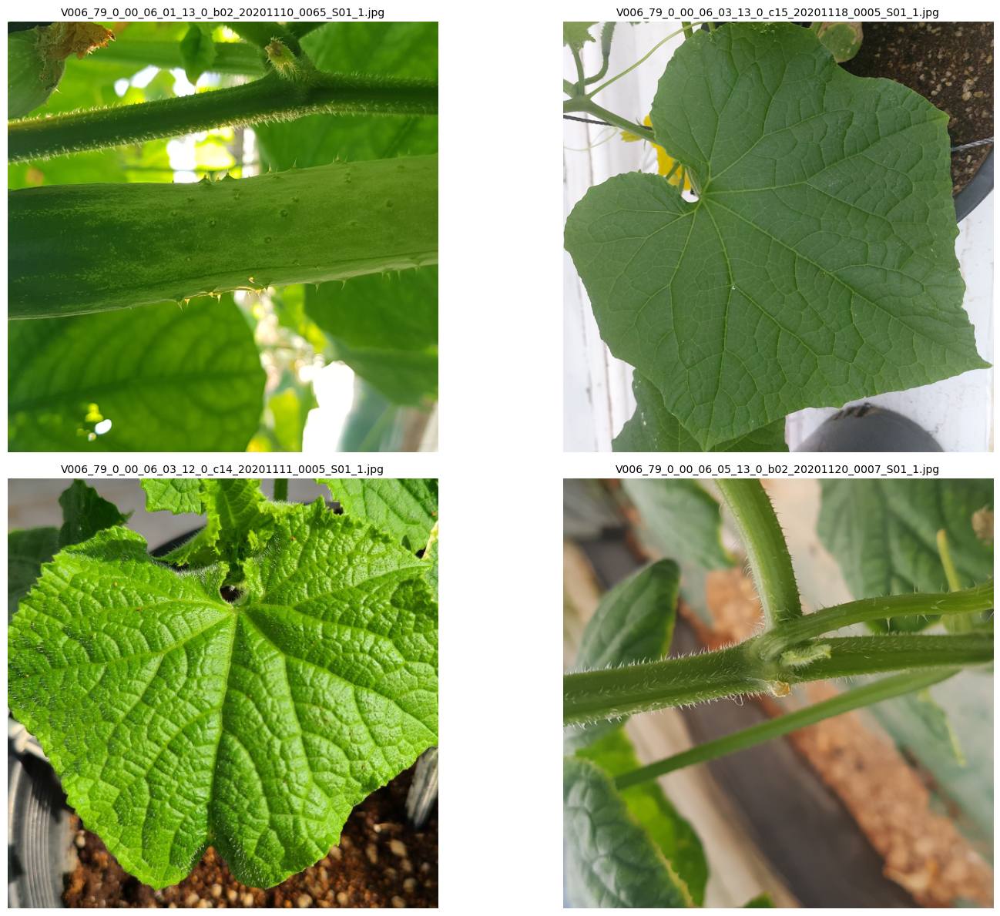

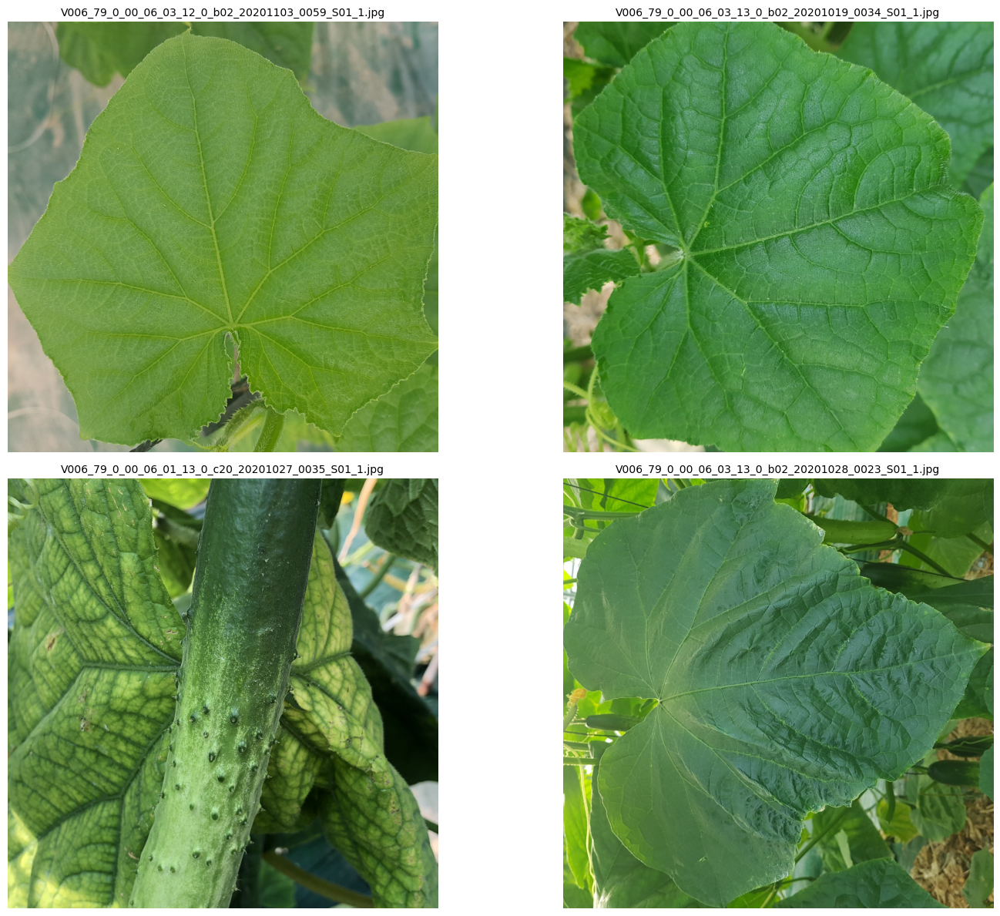

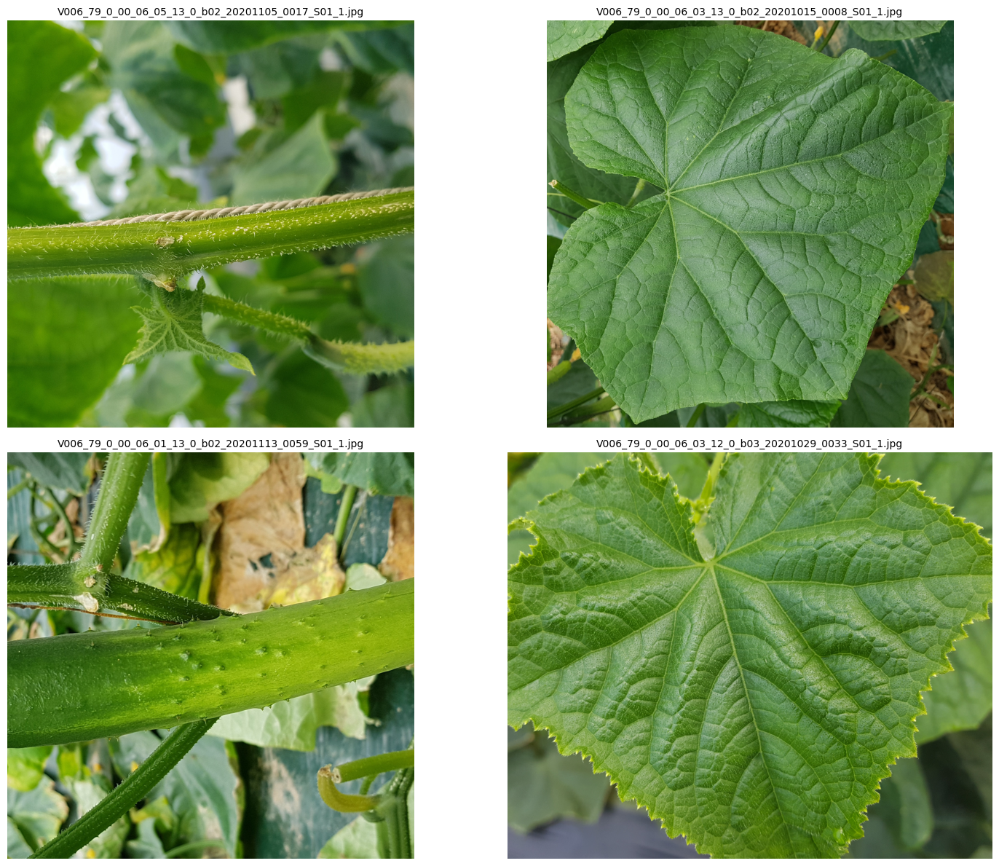

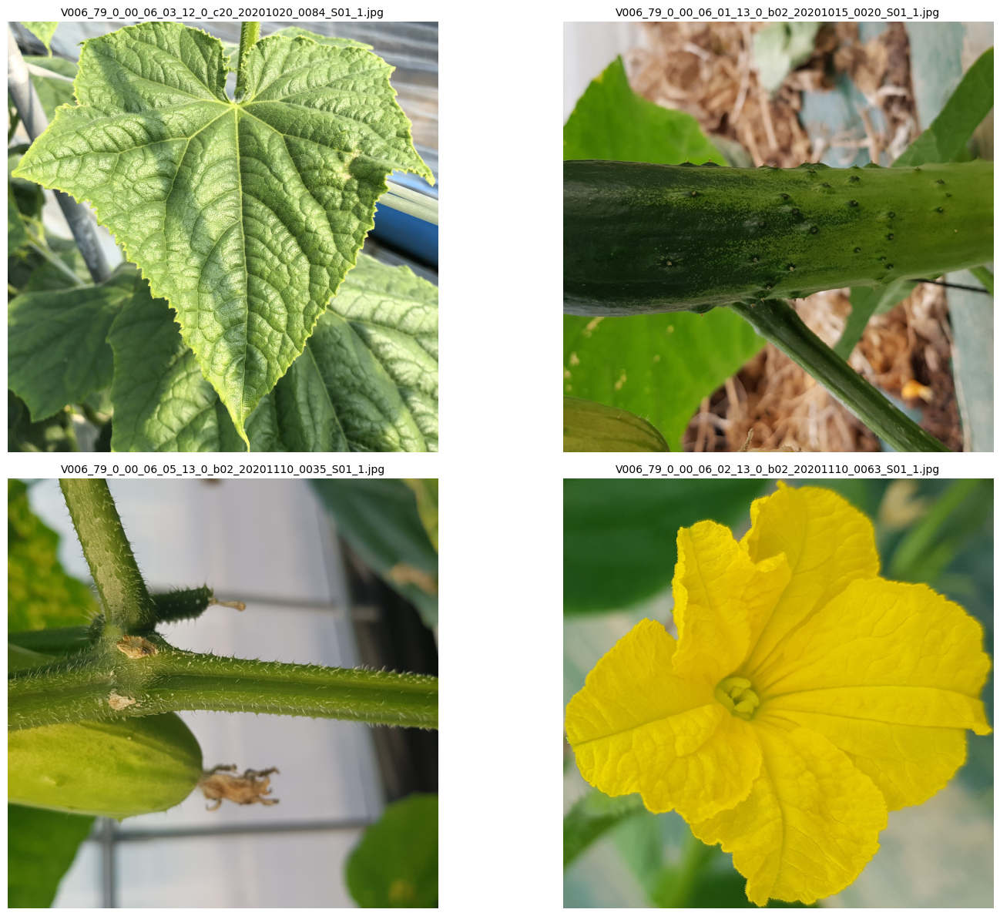

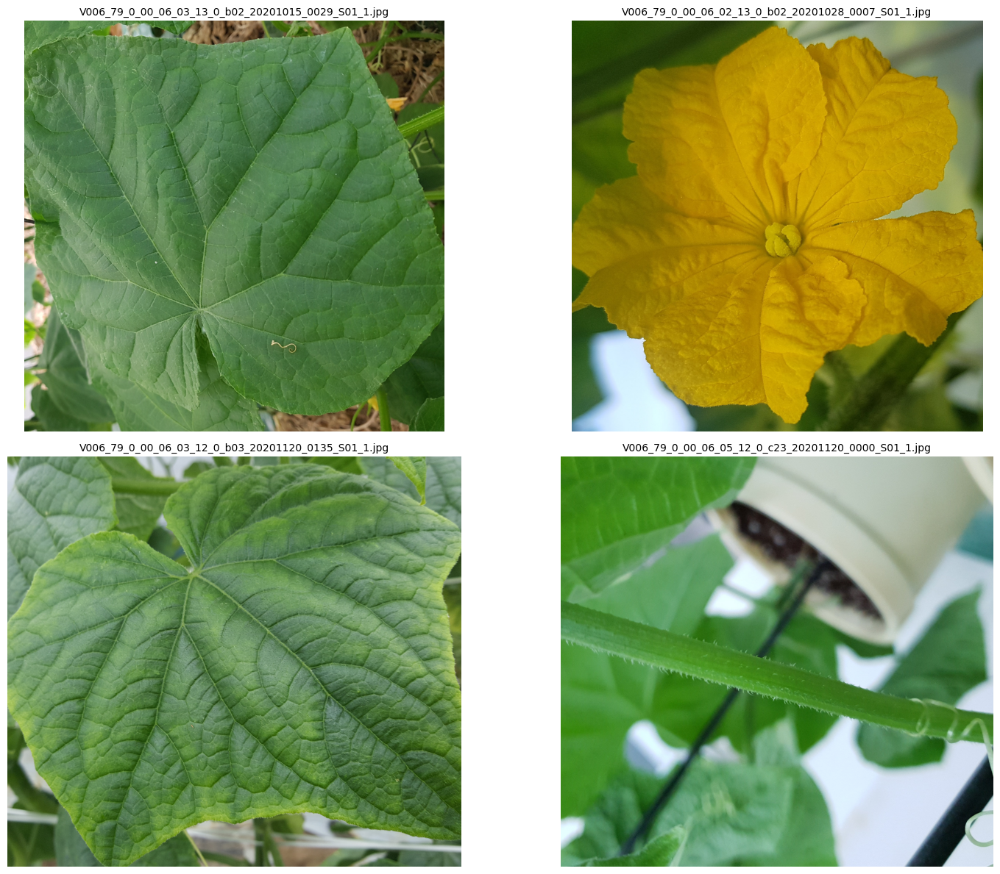

In [7]:
# 4장씩 묶어서 출력
batch_size = 4
for i in range(0, len(image_label_pairs), batch_size):
    visualize_images_grid_with_crop(image_label_pairs[i:i+batch_size], grid_size=(2, 2))